In [ ]:
#2.1 nạp ảnh sử dụng thư viện python image library(PIL)
#  su dung thu vien python image library
# thu vien de mo, xu ly voi nhieu dinh dang khac nhau
from PIL import Image
import numpy as np

img = Image.open('image/bird.png')
img.show()

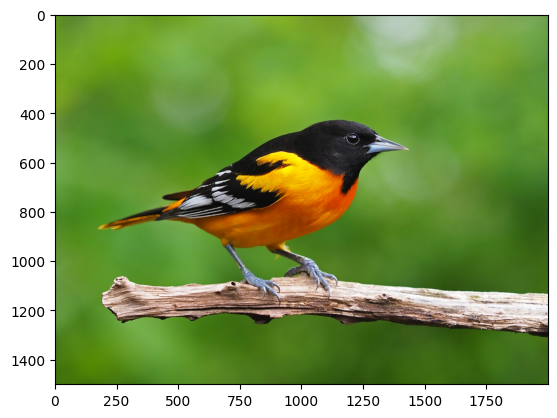

In [ ]:
#2.2 Nạp ảnh sử dụng thư viện imageio
# imageio dung de doc ghi du lieu anh, anh dong
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('image/bird.png')
plt.imshow(data)
plt.show()

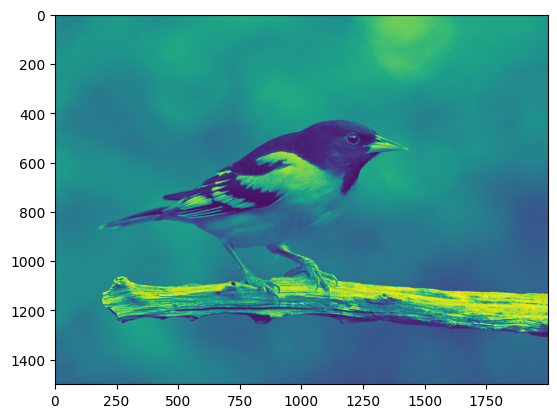

In [ ]:
#2.3 Đôj phân giải ảnh
# nạp ảnh màu và chuyển sang ảnh grayscale
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('image/bird.png', mode='F')
plt.imshow(data)
plt.show()

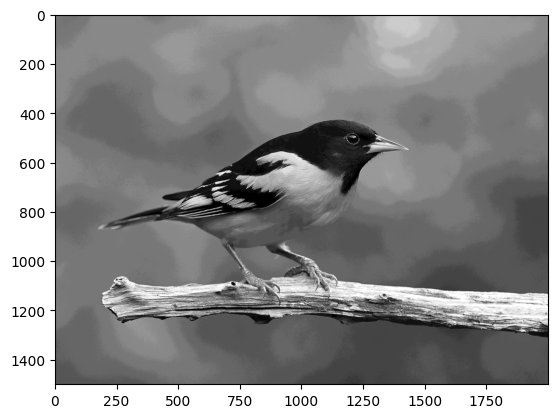

In [12]:
# nạp ảnh màu và chuyển sang ảnh grayscale
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('image/bird.png', mode='F').astype(np.uint8)
cl = data & 0xF0
iio.imsave('image/birdf0.png', cl)
tmp = iio.imread('image/birdf0.png')
plt.imshow(tmp, cmap='gray')  # cmap=gray chỉ định lấy màu gray
plt.show()

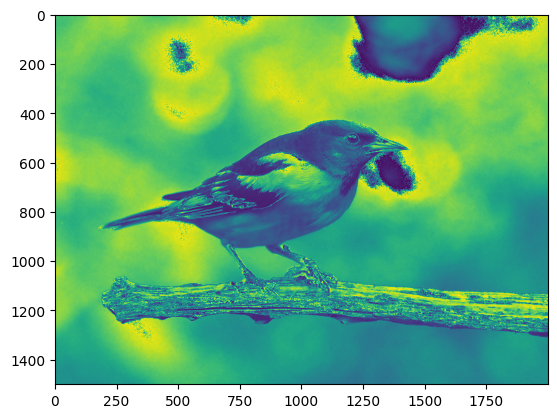

In [13]:
#2.4 màu sắc với hệ RGB
# để biểu diễn màu, 
# mỗi pixel trong một ảnh sử dụng 3 giá trị ứng với 3 kệnh(red,blue,green) 
# chương trình hiển thị ảnh với kệnh mầu blue and green
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('image/bird.png')
bdata = (data[:, :, 1] + data[:, :, 2])
plt.imshow(bdata)
plt.show()

In [ ]:
#2.5 màu sắc với hệ HSV
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

a = colorsys.rgb_to_hsv(255, 0, 0)
print(a)

b = colorsys.rgb_to_hsv(1, 0, 0)
print(b)

c = colorsys.rgb_to_hsv(0, 255, 0)
print(c)

d = colorsys.rgb_to_hsv(1, 1, 255)
print(d)

(0.0, 1.0, 255)
(0.0, 1.0, 1)
(0.3333333333333333, 1.0, 255)
(0.6666666666666666, 0.996078431372549, 255)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


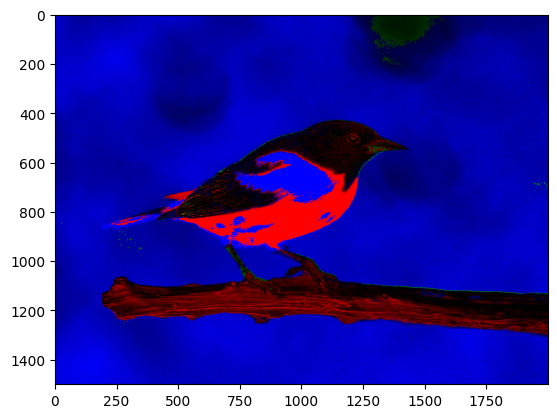

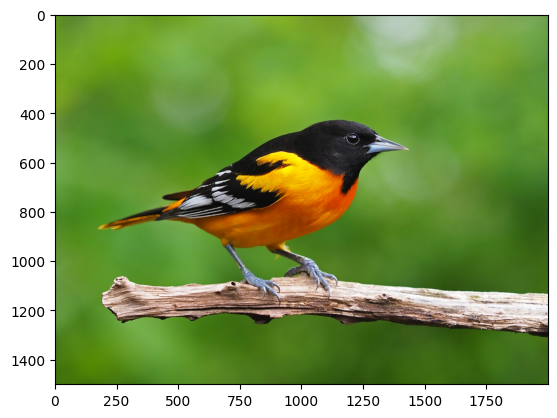

In [ ]:
#2.6 úng dụng chuyển đổi hệ màu
# mã thay đổi giá trị kênh Hue của các pixel 
# trong một ảnh bằng phương giá trị ban đầu của Hue
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

rgb = iio.imread('image/bird.png')

#chuyển ảnh từ hệ màu RGB -> HSV
rgb2hsv = np.vectorize(colorsys.rgb_to_hsv)

#tính bình phương giá trị kênh Hue
h, v, s = rgb2hsv(rgb[:, :,0], rgb[:,:,2], rgb[:,:,1])
h = h*h

#tạo ảnh mới sử dụng gía trị H mới và gía trị Saturation và Values của ảnh ban đầu 
#chuyển ảnh tư hệ màu HSV -> RGB
hsv2rgb = np.vectorize(colorsys.hsv_to_rgb)
rgb2 = hsv2rgb(h,s,v)
rgb2 = np.array(rgb2).transpose((1,2,0))
plt.imshow(rgb2)
plt.show()
plt.imshow(rgb)
plt.show()

2.7  Lọc ảnh
lọc ảnh được dùng để khử nhiễu(noise) trong ảnh, có 2 loại khử nhiễu
    Linear filter: mean, laplacian và laplacian của gaussian
    non-linear filter: median, maximum, minimum, sobel, prewitt và canny

[[152 161 150 ... 187 193 196]
 [153 160 151 ... 184 191 196]
 [153 157 144 ... 189 200 202]
 ...
 [ 57  68  55 ...  89  84  83]
 [ 43  53  46 ...  84  74  74]
 [ 57  61  47 ...  79  73  70]]


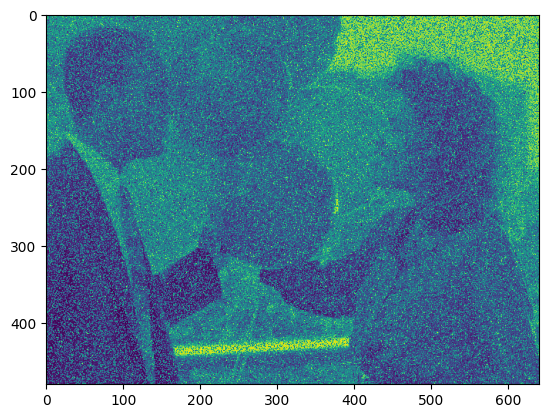

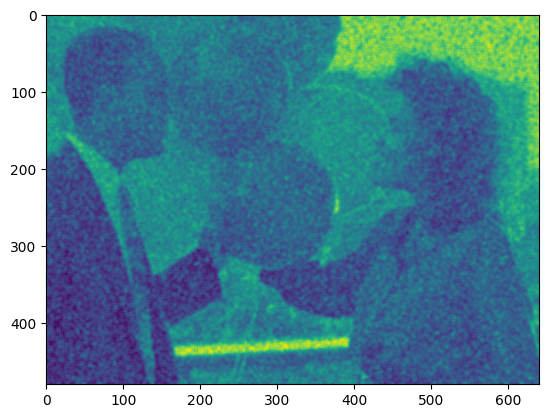

In [ ]:
#   Lọc ảnh với mean filter
import scipy.ndimage as sn
import imageio.v2 as iio
import colorsys
import matplotlib.pylab as plt
import numpy  as np

a = iio.imread('image/balloons_noisy.png', mode='F').astype(np.uint8)
k = np.ones((5,5))/25
b = sn.convolve(a,k).astype(np.uint8)
iio.imsave('image/balloons_noisy_mean_filter.png', b)
print(b)
plt.imshow(a)
plt.show()
plt.imshow(b)
plt.show()

[[162 162 159 ... 210 210 209]
 [151 159 151 ... 210 210 210]
 [151 158 149 ... 210 211 210]
 ...
 [ 10  11  11 ...  65  67  67]
 [ 10  10  11 ...  65  67  67]
 [ 10  10  10 ...  65  67  67]]


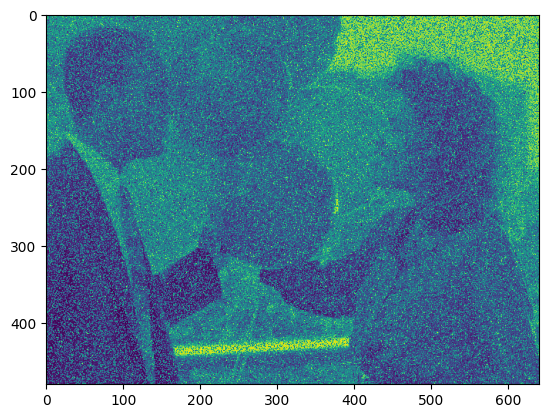

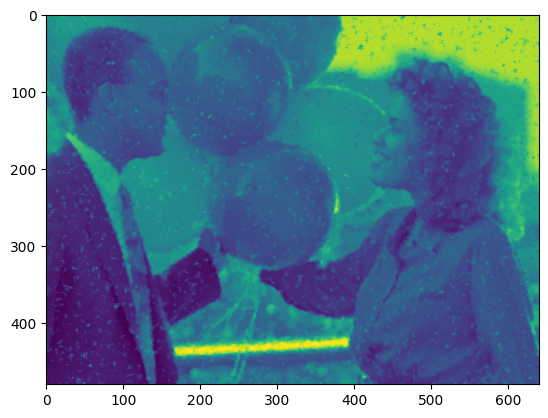

In [ ]:
#lọc ảnh với median filter

a = iio.imread('image/balloons_noisy.png', mode='F').astype(np.uint8)
k = np.ones((5, 5))/25
#b = sn.convolve(a, k).astype(np.uint8)
b  = sn.median_filter(a, size=5, footprint=None,output=None,
                      mode = 'reflect', cval=0.0, origin=0)
iio.imsave('image/balloons_noisy_median_filter.png', b)
print(b)
plt.imshow(a)
plt.show()
plt.imshow(b)
plt.show()

[[60 60 49 ... 28 76 76]
 [60 60 47 ... 28 76 76]
 [60 60 47 ... 28 76 76]
 ...
 [ 8  6  6 ...  0  0  0]
 [ 8  6  6 ...  0  0  0]
 [ 9  6  6 ...  0  0  0]]


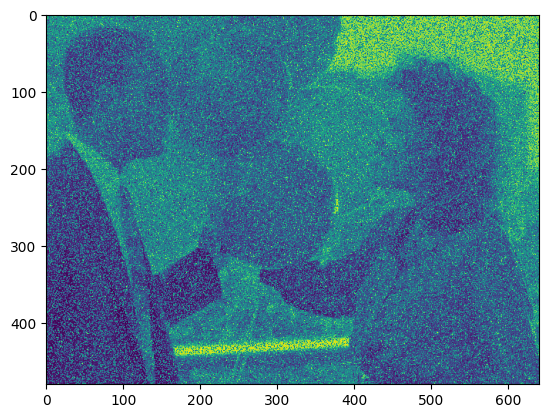

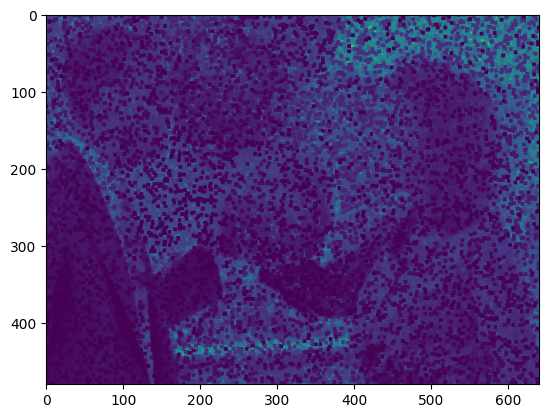

In [ ]:
# lọc ảnh với min filter 
# nó sẽ làm tăng độ tối cho ảnh
a = iio.imread('image/balloons_noisy.png', mode='F').astype(np.uint8)
k = np.ones((5, 5))/25
b = sn.minimum_filter(a, size=5, footprint=None, output=None,
                      mode='reflect', cval=0.0, origin=0)
iio.imsave('image/balloons_noisy_min_filter.png', b)
print(b)
plt.imshow(a)
plt.show()
plt.imshow(b)
plt.show()

2.8 Dò cạnh biên của ảnh
kĩ thuật nhận dạng hoặc đo lường các đối tượng trong ảnh qua đường biên giữa các đối tượng
có 2 dạng làm nổi bật đường biên đối tượng:
    first derivative: xác định các giá trị có sẵn cuả ảnh tới cạnh biên
    second derivative: xác định các điểm giao nhau bằng 0

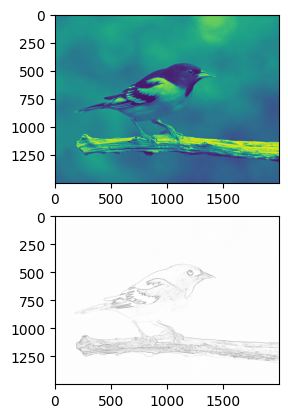

In [ ]:
# Sobel filter code: Ứng dụng của đạo hàm (dạng xấp xỉ)

import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import filters
import matplotlib.pylab as plt
import colorsys

a = iio.imread('image/bird.png', mode='F')
b = filters.sobel(a).astype(np.uint8)
iio.imsave('image/bird_sobel_filter.png', 255-b)
# print(a)
# print(b)
plt.subplot(2, 1, 1)
plt.imshow(a)
plt.subplot(2, 1, 2)
plt.imshow(255-b, cmap='gray')
plt.show()

[[118.516 119.445 117.559 ... 132.99  133.403 131.528]
 [118.929 119.63  118.858 ... 138.805 129.816 129.229]
 [120.94  121.929 118.043 ... 132.577 127.115 131.528]
 ...
 [ 87.035  85.448  86.334 ...  78.294  81.066  81.066]
 [ 88.334  95.693  96.693 ...  83.767  82.767  78.479]
 [ 89.22   89.693  92.878 ...  79.365  80.767  81.354]]
[[0 0 0 ... 2 2 2]
 [1 1 0 ... 1 3 1]
 [4 4 1 ... 4 0 3]
 ...
 [1 4 4 ... 1 1 1]
 [2 4 3 ... 1 0 0]
 [2 4 3 ... 1 0 1]]


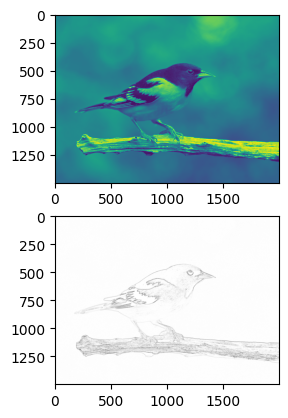

In [ ]:
# sử dụng Prewit filter
a = iio.imread('image/bird.png', mode='F')
b = filters.prewitt(a).astype(np.uint8)
iio.imsave('image/bird_prewitt_filter.png', 255-b)
print(a)
print(b)
plt.subplot(2, 1, 1)
plt.imshow(a)
plt.subplot(2, 1, 2)
plt.imshow(255-b, cmap='gray')
plt.show()

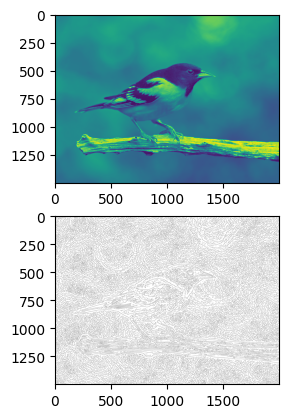

In [ ]:
# sử dụng canny filter 
from skimage import feature 

a = iio.imread('image/bird.png', mode='F')
b = feature.canny(a, sigma=3).astype(np.uint8)
iio.imsave('image/bird_canny_filter.png', 255-b)
#print(a)
#print(b)
plt.subplot(2, 1, 1)
plt.imshow(a)
plt.subplot(2, 1, 2)
plt.imshow(255-b, cmap='gray')
plt.show()

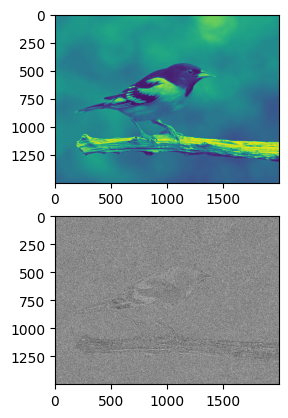

In [ ]:
# sử dụng second derivative
#a = iio.imread('bird.png')
a = iio.imread('image/bird.png', mode='F')
b = sn.laplace(a, mode='reflect').astype(np.uint8)
iio.imsave('image/bird_canny_filter.png', 255-b)
# print(a)
# print(b)
plt.subplot(2, 1, 1)
plt.imshow(a)
plt.subplot(2, 1, 2)
plt.imshow(255-b, cmap='gray')
plt.show()

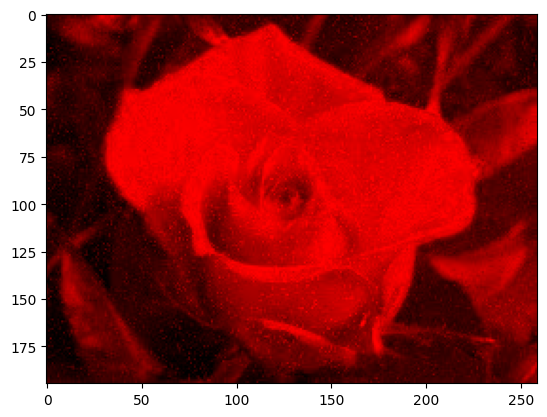

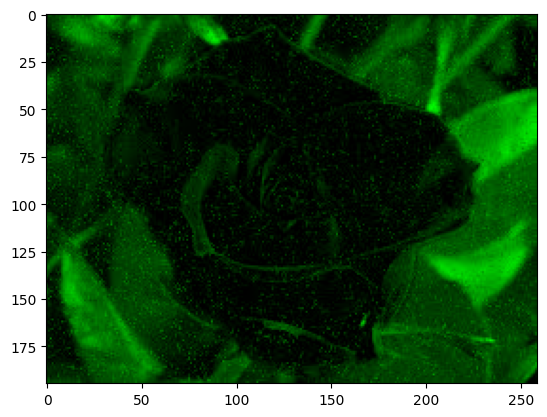

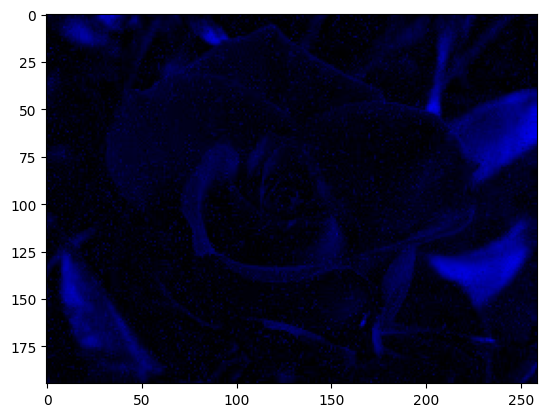

In [9]:
#Bai tap_01: nạp 1 ảnh lưu thành 3 ảnh với 3 màu khác nhau
import imageio.v2 as iio
import numpy as np

# read picture
data = iio.imread('image/flower.jpeg') 

do = np.zeros_like(data)    #red only
do[..., 0] = data[..., 0]

xanhla = np.zeros_like(data)    #green only
xanhla[..., 1] = data[..., 1]

xanhduong = np.zeros_like(data)     #blue only
xanhduong[..., 2] = data[..., 2]

# save picture
iio.imsave('image/do.png',do)
plt.imshow(do)
plt.show()
iio.imsave('image/xanhla.png',xanhla)
plt.imshow(xanhla)
plt.show()
iio.imsave('image/xanhduong.png',xanhduong)
plt.imshow(xanhduong)
plt.show()

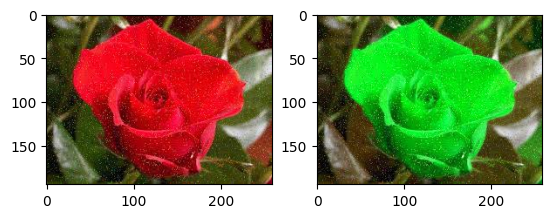

In [ ]:
#Bai tap 02: nạp một ảnh và hoán đổi giá trị các màu,lưu ảnh
import matplotlib.pylab as plt

data = iio.imread('image/flower.jpeg')
swapped = data[:,:,[1,0,2]]
iio.imwrite('image/flower_xanhla.png', swapped)
plt.subplot(1,2,1)
plt.imshow(data)
plt.subplot(1,2,2)
plt.imshow(swapped)
plt.show()

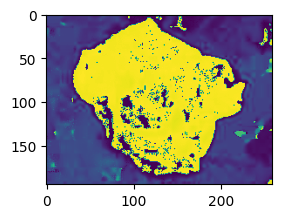

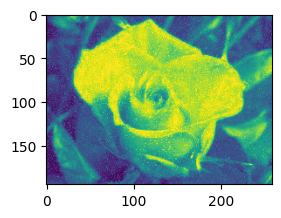

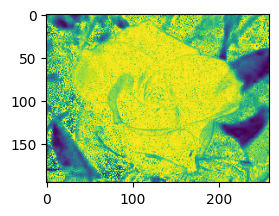

In [ ]:
#Bai tap 03 : mã nạp vào 1 ảnh,
#  chuyển sang hệ màu hsv và lưu thành 3 ảnh với vớ 3 màu khác nhau
import colorsys

img = iio.imread('image/flower.jpeg')
rgb2hsv = np.vectorize(colorsys.rgb_to_hsv)

h, s, v = rgb2hsv(img[:, :, 0]/255, img[:, :, 1]/255, img[:, :, 2]/255)
iio.imwrite('image/h.png', (h*255).astype(np.uint8))
plt.subplot(1,2,1)
plt.imshow(h)
plt.show()
iio.imwrite('image/s.png', (s*255).astype(np.uint8))
plt.subplot(1,2,2)
plt.imshow(v)
plt.show()
iio.imwrite('image/v.png', (v*255).astype(np.uint8))
plt.subplot(2,1,2)
plt.imshow(s)
plt.show()

In [21]:
#Bai tap 04:mã nạp vào 1 ảnh, chuyển snag hệ màu hsv và thay đổi h thành v

h = h / 3 
v = v*0.75
hsv2rgb = np.vectorize(colorsys.hls_to_rgb)
r, g, b = hsv2rgb(h,s,v)
rgb_new = np.dstack((r,g,b)) * 255
iio.imwrite('image/hsv_modifile.png', rgb_new.astype(np.uint8))


[[41 39 44 ... 70 72 70]
 [38 38 43 ... 70 71 69]
 [38 38 43 ... 69 71 70]
 ...
 [49 46 46 ... 62 53 48]
 [56 51 51 ... 51 46 44]
 [61 55 55 ... 43 41 42]]


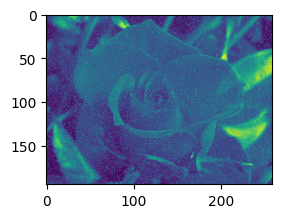

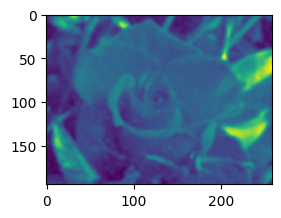

In [22]:
#Bai tap 05 : sử dụng mean filter cho hình ảnh trong thư mục image
import scipy.ndimage as sn
import imageio.v2 as iio
import colorsys
import matplotlib.pylab as plt
import numpy as np

a = iio.imread('image/flower.jpeg', mode='F').astype(np.uint8)
k = np.ones((5, 5))/25
b = sn.convolve(a, k).astype(np.uint8)
iio.imsave('image/flower_mean_filter.png', b)
print(b)
plt.subplot(1,2,1)
plt.imshow(a)
plt.show()
plt.subplot(1,2,2)
plt.imshow(b)
plt.show()

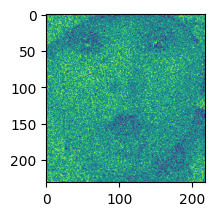

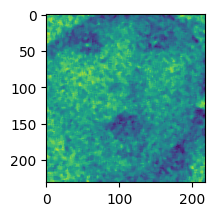

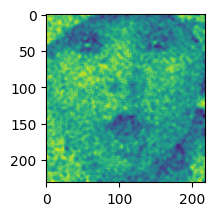

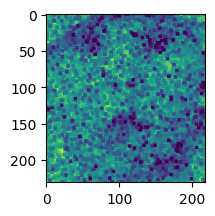

In [23]:
#bai tap 6: mã sử dụng cac filter khử nhiễu 
a = iio.imread('image/baby.jpeg', mode='F').astype(np.uint8)
k = np.ones((5, 5))/25

# b = sn.convolve(a, k).astype(np.uint8)
median = sn.median_filter(a, size=5, footprint=None, output=None,
                     mode='reflect', cval=0.0, origin=0)
mean = sn.convolve(a, k).astype(np.uint8)
min = sn.minimum_filter(a, size=5, footprint=None, output=None,
                      mode='reflect', cval=0.0, origin=0)

iio.imsave('image/baby_mean_filter.jpeg', mean)
iio.imsave('image/baby_median_filter.jpeg', median)
iio.imsave('image/baby_min_filter.jpeg', median)

#print(b)
plt.subplot(2, 1, 1)
plt.imshow(a)
plt.show()

plt.subplot(2, 1, 2)
plt.imshow(median)
plt.show()

plt.subplot(2,1,2)
plt.imshow(mean)
plt.show()

plt.subplot(2, 1, 2)
plt.imshow(min)
plt.show()

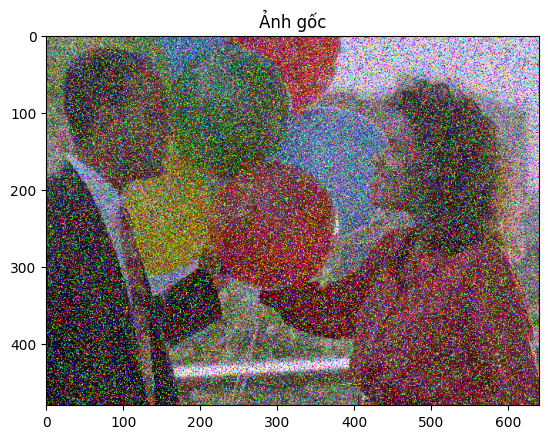

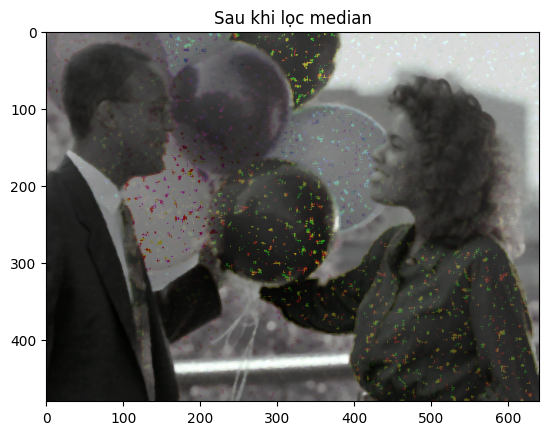

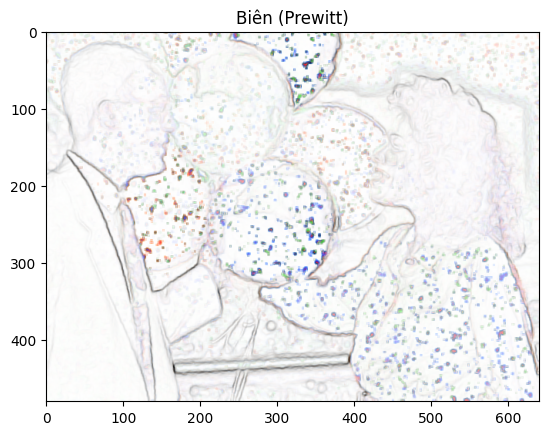

In [6]:
import numpy as np
import imageio.v2 as iio
from skimage import filters
import matplotlib.pyplot as plt
import scipy.ndimage as sn

# Đọc ảnh đúng định dạng
a = iio.imread('image/balloons_noisy.png')

# Median filter để khử nhiễu
b = sn.median_filter(a, size=5, mode='reflect')

# Áp dụng Prewitt filter để xác định biên
c = filters.prewitt(b).astype(np.float32)  # giữ float để không bị mất dữ liệu
c = (255 * c / c.max()).astype(np.uint8)   # chuẩn hóa về 0–255

# Lưu ảnh sau khi xử lý
iio.imsave('image/7_balloons_noisy_median_filter.png', 255 - c)

# Hiển thị các ảnh
plt.imshow(a)
plt.title("Ảnh gốc")
plt.show()

plt.imshow(b)
plt.title("Sau khi lọc median")
plt.show()

plt.imshow(255 - c, cmap='gray')
plt.title("Biên (Prewitt)")
plt.show()

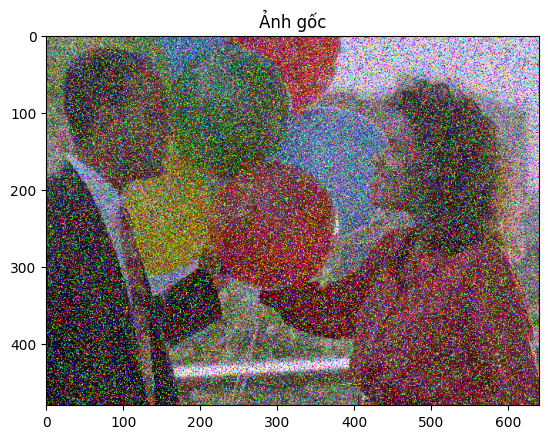

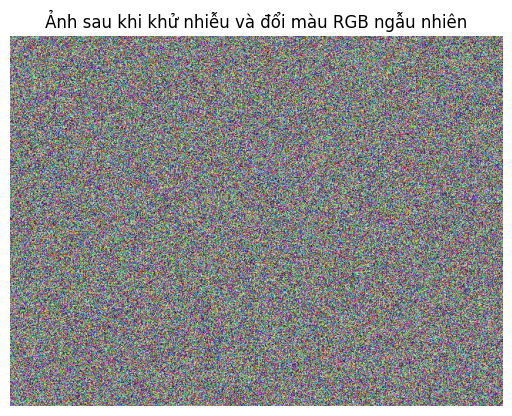

In [8]:
#Bai tap 8: mã đổi màu RGB ngẫu nhiên của hình rong image, lưu hình
#khử nhiễu trước khi đổi màu
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import scipy.ndimage as sn

# Bước 1: Đọc ảnh
a = iio.imread('image/balloons_noisy.png')

# Bước 2: Khử nhiễu bằng median filter (áp dụng riêng cho từng kênh màu)
filtered = np.zeros_like(a)
for i in range(3):  # RGB
    filtered[..., i] = sn.median_filter(a[..., i], size=5, mode='reflect')

# Bước 3: Đổi màu RGB ngẫu nhiên
# Tạo ma trận ngẫu nhiên có cùng shape
random_rgb = np.random.randint(0, 256, size=filtered.shape, dtype=np.uint8)

# Trộn màu ngẫu nhiên theo cách giữ cấu trúc ảnh (đổi từng pixel nhưng giữ vị trí)
randomized = random_rgb

# Bước 4: Lưu ảnh kết quả
iio.imsave('image/balloons_random_color.png', randomized)

# Hiển thị ảnh
plt.imshow(a)
plt.title("Ảnh gốc")
plt.show()
plt.imshow(randomized)
plt.title("Ảnh sau khi khử nhiễu và đổi màu RGB ngẫu nhiên")
plt.axis('off')
plt.show()

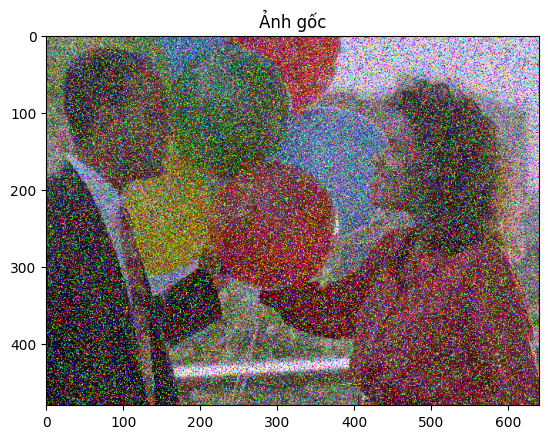

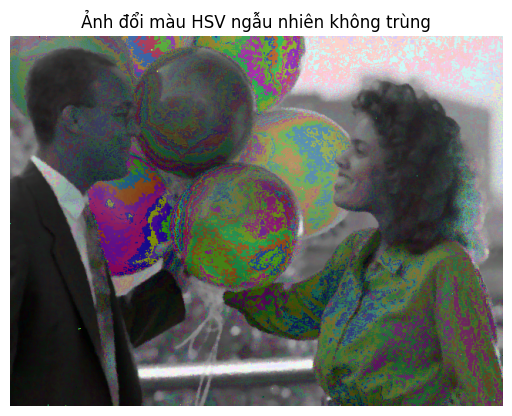

In [11]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import scipy.ndimage as sn
from skimage.color import rgb2hsv, hsv2rgb

# Đọc ảnh
a = iio.imread('image/balloons_noisy.png')

# Khử nhiễu bằng median filter (áp dụng từng kênh)
filtered = np.zeros_like(a)
for i in range(3):  # RGB
    filtered[..., i] = sn.median_filter(a[..., i], size=5, mode='reflect')

# Chuyển ảnh sang HSV
hsv_img = rgb2hsv(filtered / 255.0)  # chuẩn hóa về 0–1 trước khi chuyển HSV

# Trích kênh Hue
hue = hsv_img[..., 0]

# Lấy các giá trị Hue duy nhất (làm tròn để gom nhóm màu)
unique_hue = np.unique(np.round(hue * 360)).astype(int)

# Tạo hoán vị ngẫu nhiên không trùng
shuffled_hue = np.random.permutation(unique_hue)

# Tạo ánh xạ: hue_gốc → hue_mới
hue_map = dict(zip(unique_hue, shuffled_hue))

# Tạo bản sao mới cho hue đã đổi
new_hue = np.copy(hue)

# Gán lại hue mới theo ánh xạ
for old_h, new_h in hue_map.items():
    mask = (np.round(hue * 360).astype(int) == old_h)
    new_hue[mask] = new_h / 360.0

# Gộp lại ảnh HSV mới
hsv_img[..., 0] = new_hue
rgb_result = (hsv2rgb(hsv_img) * 255).astype(np.uint8)

#  Lưu ảnh
iio.imsave('image/balloons_hsv_random_color.png', rgb_result)

# Hiển thị
plt.imshow(a)
plt.title("Ảnh gốc")
plt.show()
plt.imshow(rgb_result)
plt.title("Ảnh đổi màu HSV ngẫu nhiên không trùng")
plt.axis('off')
plt.show()